In [1]:
import torch
import torch.nn.functional as F

from PIL import Image
import cv2

import os
import json
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import torchvision
from torchvision import models
from torchvision import transforms
import albumentations as alb

from dataset import PatchDataset
from model import PatchClassifier, ModelHandler
import config
import utils

from captum.attr import IntegratedGradients
from captum.attr import GradientShap
from captum.attr import Occlusion
from captum.attr import NoiseTunnel
from captum.attr import visualization as viz

In [2]:
default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)

In [3]:
INF_DICE = 88.24

model = PatchClassifier(
    features_only=config.FEATURES_ONLY, 
    out_classes=config.NUM_CLASSES,
    freeze_encoder=config.FREEZE_ENCODER,
)

ref_dataset = PatchDataset(config.DATA_DIR, config.ATF, preproc=False, augment=False)
dataset = PatchDataset(config.DATA_DIR, config.ATF, preproc=True, augment=False)

mh = ModelHandler(model)
mh.load(os.path.join(config.MODEL_FOLDER, f'{config.CONFIG_ID}_{INF_DICE}.pt'))
model = mh.model.model

model = model.eval()

In [4]:
classes = list(dataset.class_to_idx.keys())
class_imgs = {}

# np.random.seed(42)
for class_name in classes:
    class_idx = ref_dataset.class_to_idx[class_name]
    class_img_idx = np.random.choice(np.where(np.asarray(dataset.targets) == class_idx)[0])

    ref_img = np.asarray(transforms.functional.center_crop(Image.open(ref_dataset.imgs[class_img_idx]).resize((256, 256)), (224, 224)))
        
    tensor_in = dataset[class_img_idx][0].unsqueeze(0)
    target_class = int(dataset[class_img_idx][1])
    
    output = F.softmax(model(tensor_in), dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)
    pred_label_idx.squeeze_()
    predicted_label = dataset.idx_to_class[pred_label_idx.item()]        

    ### Gradient-based attribution
    integrated_gradients = IntegratedGradients(model)
    attributions_ig = integrated_gradients.attribute(tensor_in, target=pred_label_idx, n_steps=200)
    attr_img = np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1,2,0))
    
    ### plus NoiseTunnel
    noise_tunnel = NoiseTunnel(integrated_gradients)
    attributions_ig_nt = noise_tunnel.attribute(tensor_in, nt_samples=10, nt_type='smoothgrad_sq', target=pred_label_idx)
    attr_ig_nt_img = np.transpose(attributions_ig_nt.squeeze().cpu().detach().numpy(), (1,2,0))

    ### GradientShap
    torch.manual_seed(0)
    np.random.seed(0)
    gradient_shap = GradientShap(model)
    # Defining baseline distribution of images
    rand_img_dist = torch.cat([tensor_in * 0, tensor_in * 1])
    attributions_gs = gradient_shap.attribute(tensor_in, n_samples=50, stdevs=0.0001, baselines=rand_img_dist, target=pred_label_idx)
    attr_gs_img = np.transpose(attributions_gs.squeeze().cpu().detach().numpy(), (1,2,0))

    ### Occlusion
    occlusion = Occlusion(model)
    attributions_occ = occlusion.attribute(tensor_in, strides=(3,8,8), target=pred_label_idx, sliding_window_shapes=(3,15,15), baselines=0)
    attr_occ_img = np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0))

    occlusion = Occlusion(model)
    attributions_occ = occlusion.attribute(tensor_in, strides=(3,30,30), target=pred_label_idx, sliding_window_shapes=(3,60,60), baselines=0)
    attr_occ_img_sparse = np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0))

    class_imgs[class_name] = (ref_img, target_class, predicted_label, prediction_score.squeeze().item(), 
                                attr_img, attr_ig_nt_img, attr_gs_img, attr_occ_img, attr_occ_img_sparse)

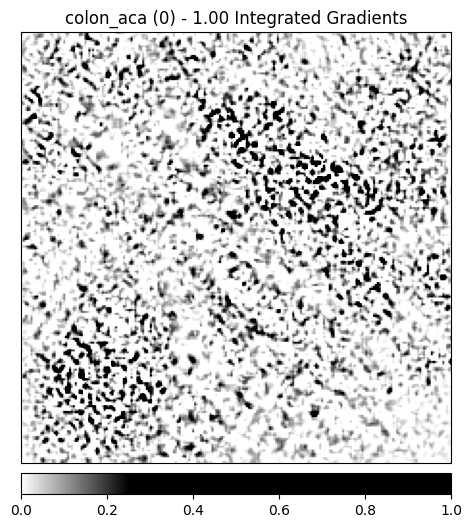

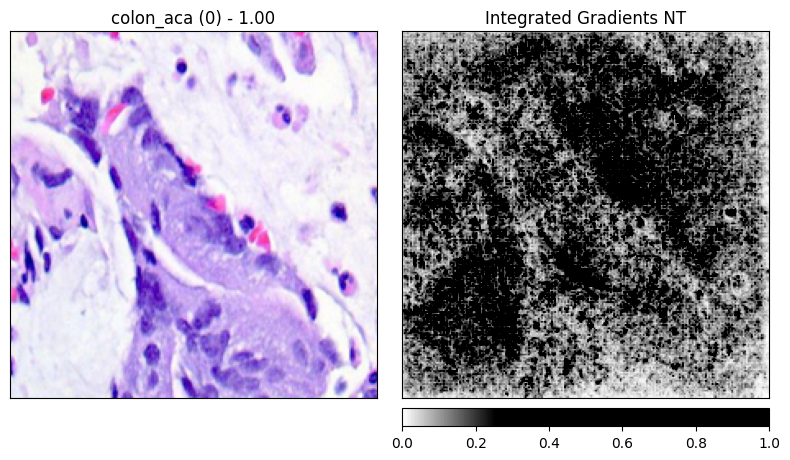

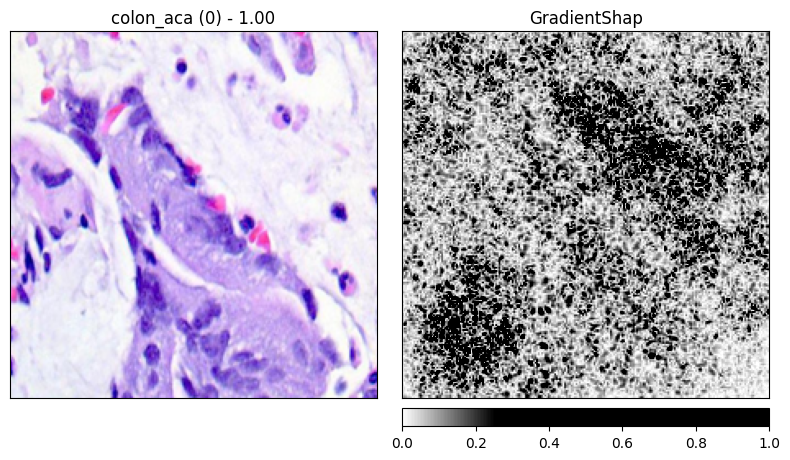

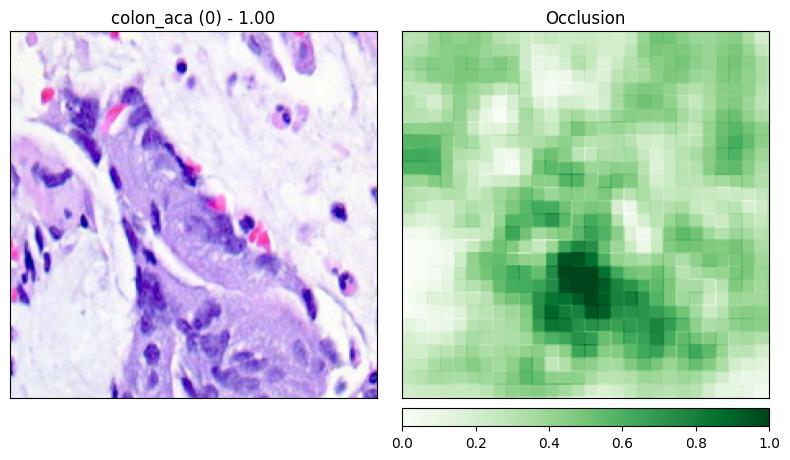

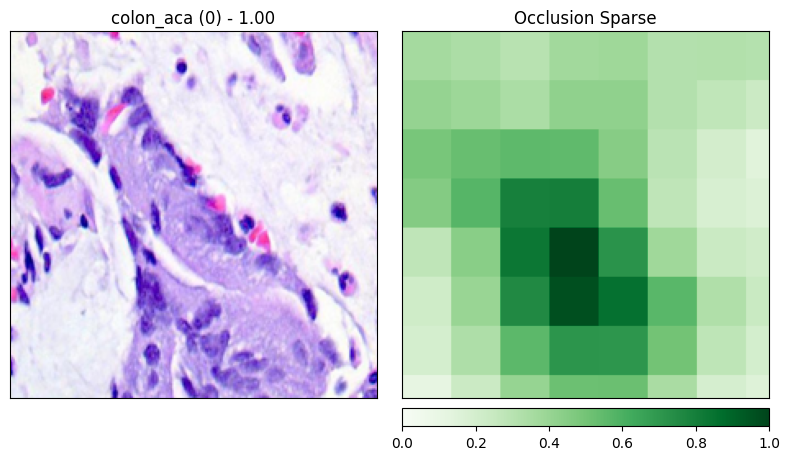

...

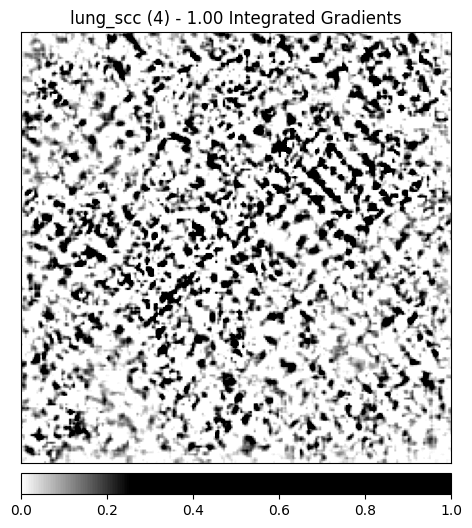

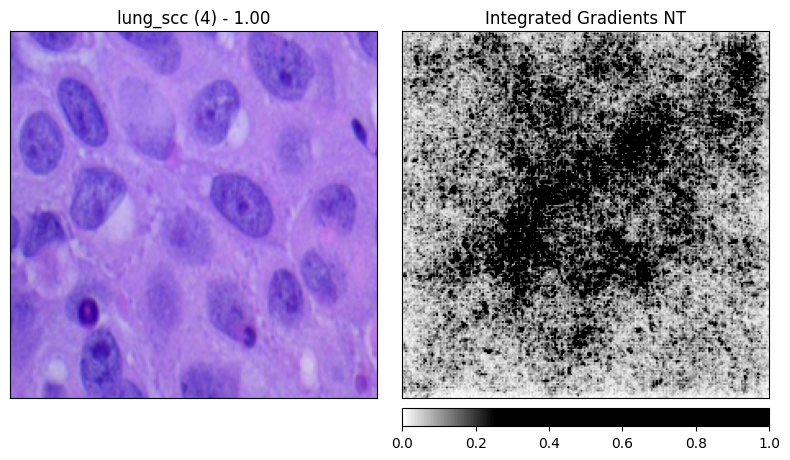

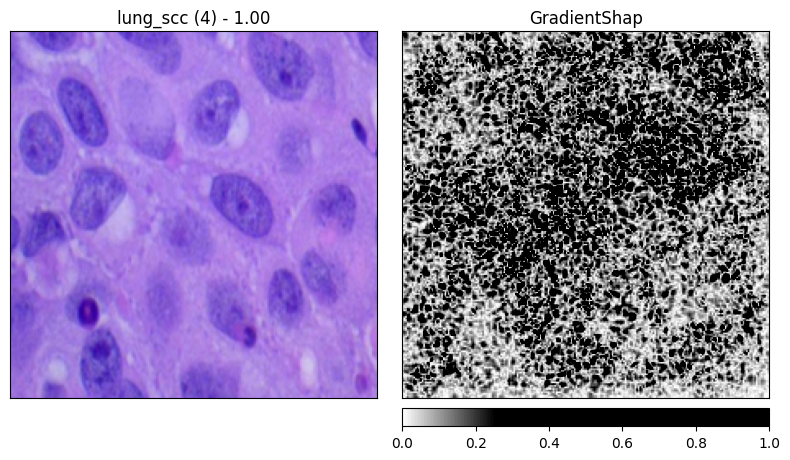

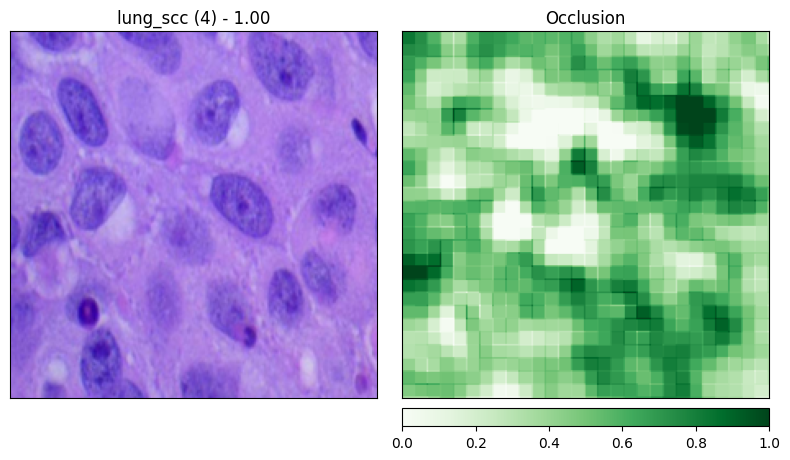

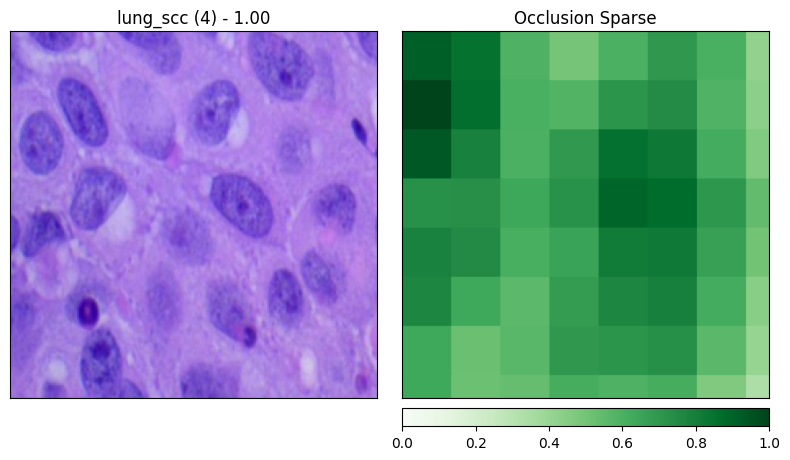

In [5]:
plot = True
for class_name, imgs in class_imgs.items():
    ref_img, target_class, predicted_label, prediction_score, attr_img, attr_ig_nt_img, attr_gs_img, attr_occ_img, attr_occ_img_sparse = imgs

    fig_1, ax_1 = viz.visualize_image_attr(attr_img, ref_img, method='heat_map', cmap=default_cmap, show_colorbar=True, sign='positive', outlier_perc=1, use_pyplot=plot,
                                                title=f"{predicted_label} ({target_class}) - {prediction_score:.2f} Integrated Gradients")
    fig_2, ax_2 = viz.visualize_image_attr_multiple(attr_ig_nt_img, ref_img, ["original_image", "heat_map"], ["all", "positive"], cmap=default_cmap, show_colorbar=True, use_pyplot=plot,
                                                titles=[f"{predicted_label} ({target_class}) - {prediction_score:.2f}", "Integrated Gradients NT"])
    fig_3, ax_3 = viz.visualize_image_attr_multiple(attr_gs_img, ref_img, ["original_image", "heat_map"], ["all", "absolute_value"], cmap=default_cmap, show_colorbar=True, use_pyplot=plot,
                                                titles=[f"{predicted_label} ({target_class}) - {prediction_score:.2f}", "GradientShap"])
    fig_4, ax_4 = viz.visualize_image_attr_multiple(attr_occ_img, ref_img, ["original_image", "heat_map"], ["all", "positive"], show_colorbar=True, outlier_perc=2, use_pyplot=plot,
                                                titles=[f"{predicted_label} ({target_class}) - {prediction_score:.2f}", "Occlusion"])
    fig_5, ax_5 = viz.visualize_image_attr_multiple(attr_occ_img_sparse, ref_img, ["original_image", "heat_map"], ["all", "positive"], show_colorbar=True, outlier_perc=2, use_pyplot=plot,
                                                titles=[f"{predicted_label} ({target_class}) - {prediction_score:.2f}", "Occlusion Sparse"])
    
    
